In [88]:
# Importamos las librerías necesarias
import os
import rasterio
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from scipy.stats import mode
from sklearn.preprocessing import normalize
from sklearn.cluster import KMeans
import cv2

In [89]:
def generar_patches_solapados(imagen, tamano=150, stride=50):
    """
    Divide la imagen en parches RGB con o sin solapamiento.

    Parámetros:
    - imagen: array (alto, ancho, 3)
    - tamano: tamaño del parche en píxeles (default=200)
    - stride: cantidad de píxeles entre parches (default=200). Si stride < tamano hay solapamiento.

    Retorna:
    - lista de parches (cada uno es un array (tamano, tamano, 3))
    """
    alto, ancho, _ = imagen.shape
    parches = []

    for y in range(0, alto - tamano + 1, stride):
        for x in range(0, ancho - tamano + 1, stride):
            parche = imagen[y:y+tamano, x:x+tamano]
            parches.append(parche)

    print(f"Se generaron {len(parches)} parches de {tamano}x{tamano} con stride {stride}")
    return parches

def construir_vectores_caracteristicas(parches, bins=256):
    """
    Construye vectores de características a partir de histogramas RGB de cada parche.

    Parámetros:
    - parches: lista de arrays (alto, ancho, 3)
    - bins: número de bins por histograma (por defecto 256)

    Retorna:
    - X: array numpy de forma (n_patches, bins * 3)
    """
    caracteristicas = []

    for parche in parches:
        vector = []
        for i in range(3):  # R, G, B
            hist, _ = np.histogram(parche[:, :, i], bins=bins, range=(0, 256), density=True)
            vector.extend(hist)
        caracteristicas.append(vector)

    X = np.array(caracteristicas)
    print(f"Se construyó una matriz de características con forma: {X.shape}")
    return X


def aplicar_kmeans(X, n_clusters=4, random_state=42):
    """
    Aplica K-Means sobre la matriz de características.

    Parámetros:
    - X: array de forma (n_patches, n_features)
    - n_clusters: número de grupos a generar
    - random_state: semilla para reproducibilidad

    Retorna:
    - labels: array con la etiqueta de cluster para cada parche
    - modelo_kmeans: el objeto KMeans entrenado
    """
    print(f"Aplicando K-Means con {n_clusters} clusters...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state,)
    labels = kmeans.fit_predict(X)
    print("K-Means finalizado.")
    return labels, kmeans

def visualizar_histogramas_promedio(X, labels, bins=256):
    """
    Visualiza los histogramas promedio por clúster (una gráfica por clúster, con subgráficos R-G-B).

    Parámetros:
    - X: matriz de características (n_samples, 768)
    - labels: etiquetas de clúster
    - bins: número de bins usados en cada histograma
    """
    n_clusters = len(np.unique(labels))
    colores = ['red', 'green', 'blue']
    titulos = ['Rojo (R)', 'Verde (G)', 'Azul (B)']

    for cl in range(n_clusters):
        indices = np.where(labels == cl)[0]
        hist_cl = X[indices]  # Subconjunto del clúster
        promedio = hist_cl.mean(axis=0)

        fig, axes = plt.subplots(1, 3, figsize=(15, 4))
        fig.suptitle(f"Histograma promedio - Clúster {cl}", fontsize=14)

        for i in range(3):
            inicio = i * bins
            fin = (i + 1) * bins
            axes[i].plot(promedio[inicio:fin], color=colores[i])
            axes[i].set_title(titulos[i])
            axes[i].set_xlabel("Intensidad")
            axes[i].set_ylabel("Frecuencia")
            axes[i].set_xlim(0, bins - 1)

        plt.tight_layout()
        plt.show()


def visualizar_mapa_clusters_coloreado(imagen, modelo, tamano=200, stride=200, normalizar=True, alpha=0.4,clustersP=[1,2],Title="Mapa de clústeres sobre imagen",bins=256):
    """
    Visualiza la imagen original superpuesta con colores por clúster (con transparencia).

    Parámetros:
    - imagen: imagen RGB original (H x W x 3)
    - modelo: modelo KMeans entrenado
    - tamano: tamaño del parche (en píxeles)
    - stride: paso entre parches
    - normalizar: si se normaliza el histograma como en el entrenamiento
    - alpha: transparencia del overlay (0 a 1)
    - clustersP: Clusters para visualizar
    """
    alto, ancho, _ = imagen.shape
    cluster_map = np.zeros_like(imagen, dtype=np.uint8)

    # Paleta de colores por clúster
    np.random.seed(42)  # Semilla para colores consistentes
    colores_cluster = np.random.randint(0, 255, size=(len(clustersP), 3), dtype=np.uint8)

    for y in range(0, alto - tamano + 1, stride):
        for x in range(0, ancho - tamano + 1, stride):
            parche = imagen[y:y+tamano, x:x+tamano]
            if parche.shape[0] == tamano and parche.shape[1] == tamano:
                # Vector de histograma
                vector = []
                for i in range(3):
                    hist, _ = np.histogram(parche[:, :, i], bins=bins, range=(0, 256), density=normalizar)
                    vector.extend(hist)
                vector = np.array(vector).reshape(1, -1)
                vector=normalize(vector,"l2")
                # Predicción de clúster
                cluster = modelo.predict(vector)[0]
                

                # Pintamos el parche en el mapa de clúster
                if cluster in clustersP:
                    color = colores_cluster[clustersP.index(cluster)]
                    cluster_map[y:y+tamano, x:x+tamano] = color
                else:
                    cluster_map[y:y+tamano, x:x+tamano]=0


    # Mostrar imagen original + superposición de clúster
    plt.figure(figsize=(12, 12))
    plt.imshow(imagen)
    plt.imshow(cluster_map, alpha=alpha)
    plt.title(Title)
    plt.axis("off")
    plt.show()



def mostrar_ejemplos_cluster(parches, labels, cluster=0, max_muestras=10):
    """
    Muestra una galería de imágenes de ejemplo para un clúster específico.

    Parámetros:
    - parches: lista de arrays (cada uno es un parche RGB)
    - labels: etiquetas del clúster para cada parche
    - cluster: número de clúster a mostrar
    - max_muestras: cantidad de parches a mostrar (por defecto 10)
    """
    indices = np.where(labels == cluster)[0]
    
    if len(indices) == 0:
        print(f"No hay parches asignados al clúster {cluster}.")
        return

    muestras = indices[:max_muestras]  # Tomamos las primeras N
    n = len(muestras)

    cols = 5
    rows = (n + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    fig.suptitle(f"{n} ejemplos del clúster {cluster}", fontsize=16)

    for i in range(rows * cols):
        ax = axes[i // cols, i % cols] if rows > 1 else axes[i]
        if i < n:
            ax.imshow(parches[muestras[i]])
            ax.set_title(f"Parche #{muestras[i]}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()





Funciones HSV

In [90]:
def construir_vectores_caracteristicas_HSV(parches, bins=256):
    """
    Construye vectores de características a partir de histogramas HSV de cada parche.

    Parámetros:
    - parches: lista de arrays (H, W, 3) en formato HSV
    - bins: número de bins por histograma

    Retorna:
    - X: array (n_patches, bins * 3)
    """
    caracteristicas = []

    for parche in parches:
        vector = []

        # H (0–180)
        hist_H, _ = np.histogram(parche[:, :, 0], bins=int(bins*180/256), range=(0, 180), density=True)
        vector.extend(hist_H)

        # S y V (0–256)
        for i in [1, 2]:
            hist, _ = np.histogram(parche[:, :, i], bins=bins, range=(0, 256), density=True)
            vector.extend(hist)

        caracteristicas.append(vector)

    X = np.array(caracteristicas)
    print(f"Se construyó una matriz de características HSV con forma: {X.shape}")
    return X
import matplotlib.pyplot as plt


def visualizar_histogramas_promedio_HSV(X, labels, bins=256):
    """
    Visualiza los histogramas promedio por clúster en espacio HSV.

    Parámetros:
    - X: matriz de características (n_samples, bins*3)
    - labels: etiquetas de clúster
    - bins: número de bins por histograma
    """
    n_clusters = len(np.unique(labels))
    colores = ['purple', 'green', 'orange']
    titulos = ['Tono (H)', 'Saturación (S)', 'Brillo (V)']

    for cl in range(n_clusters):
        indices = np.where(labels == cl)[0]
        hist_cl = X[indices]
        promedio = hist_cl.mean(axis=0)

        fig, axes = plt.subplots(1, 3, figsize=(15, 4))
        fig.suptitle(f"Histograma promedio HSV - Clúster {cl}", fontsize=14)
        binsV=int(bins*180/256)
        for i in range(3):
            if i==0:
                inicio = i * binsV
                fin = (i + 1) * binsV
                axes[i].plot(promedio[inicio:fin], color=colores[i])
                axes[i].set_title(titulos[i])
                axes[i].set_xlabel("Intensidad")
                axes[i].set_ylabel("Frecuencia")
                axes[i].set_xlim(0, binsV - 1)
            else: 
                inicio = (i-1) * bins+binsV
                fin = (i) * bins+binsV
                axes[i].plot(promedio[inicio:fin], color=colores[i])
                axes[i].set_title(titulos[i])
                axes[i].set_xlabel("Intensidad")
                axes[i].set_ylabel("Frecuencia")
                axes[i].set_xlim(0, bins - 1)

        plt.tight_layout()
        plt.show()

def visualizar_mapa_clusters_coloreado_HSV(imagen_hsv, modelo, tamano=200, stride=200, normalizar=True,
                                           alpha=0.4, clustersP=[1, 2], Title="Mapa de clústeres HSV", bins=256):
    """
    Visualiza la imagen original RGB superpuesta con colores por clúster basado en características HSV.

    Parámetros:
    - imagen_hsv: imagen HSV original (H x W x 3)
    - modelo: modelo KMeans entrenado
    - tamano: tamaño del parche (en píxeles)
    - stride: paso entre parches
    - normalizar: normalizar los histogramas
    - alpha: transparencia del overlay
    - clustersP: Clústeres a mostrar
    - Title: título del gráfico
    - bins: número de bins por histograma
    """
    alto, ancho, _ = imagen_hsv.shape
    cluster_map = np.zeros((alto, ancho, 3), dtype=np.uint8)

    np.random.seed(42)
    colores_cluster = np.random.randint(0, 255, size=(len(clustersP), 3), dtype=np.uint8)

    for y in range(0, alto - tamano + 1, stride):
        for x in range(0, ancho - tamano + 1, stride):
            parche = imagen_hsv[y:y+tamano, x:x+tamano]
            if parche.shape[0] == tamano and parche.shape[1] == tamano:
                vector = []

                hist_H, _ = np.histogram(parche[:, :, 0], bins=int(bins*180/256), range=(0, 180), density=True)
                vector.extend(hist_H)

                for i in [1, 2]:
                    hist, _ = np.histogram(parche[:, :, i], bins=bins, range=(0, 256), density=True)
                    vector.extend(hist)

                vector = np.array(vector).reshape(1, -1)
                

                cluster = modelo.predict(vector)[0]

                if cluster in clustersP:
                    color = colores_cluster[clustersP.index(cluster)]
                    cluster_map[y:y+tamano, x:x+tamano] = color
                else:
                    cluster_map[y:y+tamano, x:x+tamano] = 0

    # Mostrar la imagen RGB original con el overlay
    imagen_rgb = cv2.cvtColor(imagen_hsv, cv2.COLOR_HSV2RGB)

    plt.figure(figsize=(12, 12))
    plt.imshow(imagen_rgb)
    plt.imshow(cluster_map, alpha=alpha)
    plt.title(Title)
    plt.axis("off")
    plt.show()



Funciones de reconstruccion

In [91]:


def reconstruir_mapa_clusters(imagen,X, model, tamano=200, stride=100, cluster_prioritario=2,umbral=2):
    """
    Reconstruye un mapa de etiquetas por pixel a partir de los parches, asignando por moda,
    pero con prioridad absoluta al clúster indicado si está presente en los votos.

    Parámetros:
    - imagen: array RGB (H x W x 3)
    - labels: lista de etiquetas (1 por parche)
    - tamano: tamaño del parche
    - stride: desplazamiento entre parches
    - cluster_prioritario: etiqueta a priorizar si está presente (por defecto 2)

    Retorna:
    - mapa_etiquetas: array 2D (H x W) con etiquetas por pixel
    """
    alto, ancho, _ = imagen.shape
    labels=model.predict(X)
    # Creamos una matriz de listas para almacenar los votos
    votos = np.empty((alto, ancho), dtype=object)
    for y in range(alto):
        for x in range(ancho):
            votos[y, x] = []

    index = 0
    for y in range(0, alto - tamano + 1, stride):
        for x in range(0, ancho - tamano + 1, stride):
            if index >= len(labels):
                break
            etiqueta = labels[index]
            for i in range(y, y + tamano):
                for j in range(x, x + tamano):
                    votos[i, j].append(etiqueta)
            index += 1
            print(index)

    # Creamos el mapa final aplicando la prioridad
    mapa_etiquetas = np.zeros((alto, ancho), dtype=np.uint8)
    for y in range(alto):
        for x in range(ancho):
            
            if votos[y, x]:
                
                if votos[y, x].count(cluster_prioritario)>umbral :
                        mapa_etiquetas[y, x] = cluster_prioritario
                else:
                    mapa_etiquetas[y, x] = 100
            else:
                mapa_etiquetas[y, x] = 0  # sin voto
        if y%100==0:
            print(y)
    return mapa_etiquetas

def visualizar_mapa_reconstruido(imagen, mapa_etiquetas, cluster_destacado=2, alpha=0.5, color_destacado=(255, 0, 0)):
    """
    Muestra la imagen con superposición solo del clúster deseado, en color y con transparencia.

    Parámetros:
    - imagen: array RGB original
    - mapa_etiquetas: array 2D (H x W) con etiquetas por pixel
    - cluster_destacado: número de clúster a mostrar
    - alpha: transparencia del overlay
    - color_destacado: tupla RGB para el color del clúster (por defecto rojo)
    """
    alto, ancho, _ = imagen.shape
    overlay = np.zeros((alto, ancho, 3), dtype=np.uint8)

    # Asignamos color solo donde el cluster coincide
    mascara = (mapa_etiquetas == cluster_destacado)
    overlay[mascara] = color_destacado

    # Mostrar con transparencia
    plt.figure(figsize=(12, 12))
    plt.imshow(imagen)
    plt.imshow(overlay, alpha=alpha)
    plt.title(f"Región del clúster {cluster_destacado}", fontsize=14)
    plt.axis("off")
    plt.show()

In [92]:

Xs=[]
for imm in range(3):
    
    imagen_tiff = os.path.join("Samples", f"single_batch_{imm}.tif")
    with rasterio.open(imagen_tiff) as src:
        imagen = src.read()
        imagen = np.transpose(imagen, (1, 2, 0))  # Reordenar a (alto, ancho, bandas)
        imagen=cv2.resize(imagen, (imagen.shape[1]//4, imagen.shape[0]//4), interpolation=cv2.INTER_CUBIC)
    parches=generar_patches_solapados(imagen,11,3)
    Xs.append( construir_vectores_caracteristicas(parches,128))
X=np.concatenate(Xs)

print(X.shape)
X = normalize(X, norm='l2')  # L2 = coseno equivalente

labels, modelo = aplicar_kmeans(X, n_clusters=10)         
visualizar_histogramas_promedio(X,labels,128)

c:\Users\EsSe009\Documents\Vision\EDA_Proyecto\.venv\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Se generaron 25857 parches de 11x11 con stride 3


KeyboardInterrupt: 

c:\Users\EsSe009\Documents\Vision\EDA_Proyecto\.venv\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


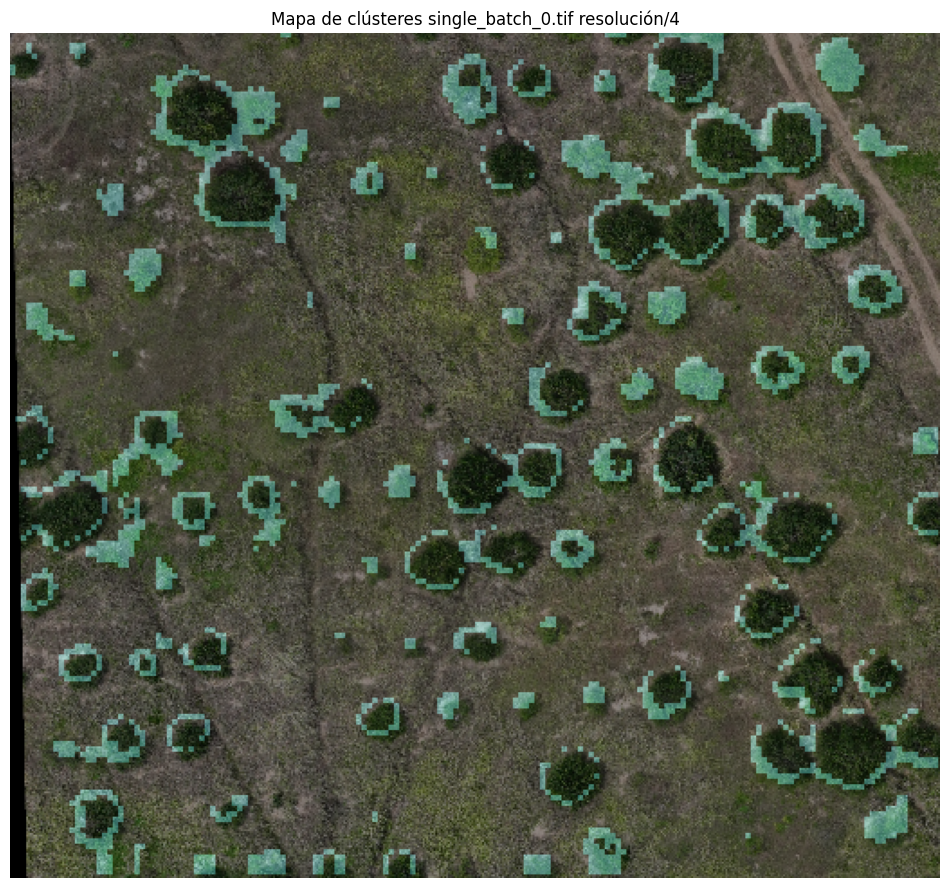

c:\Users\EsSe009\Documents\Vision\EDA_Proyecto\.venv\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


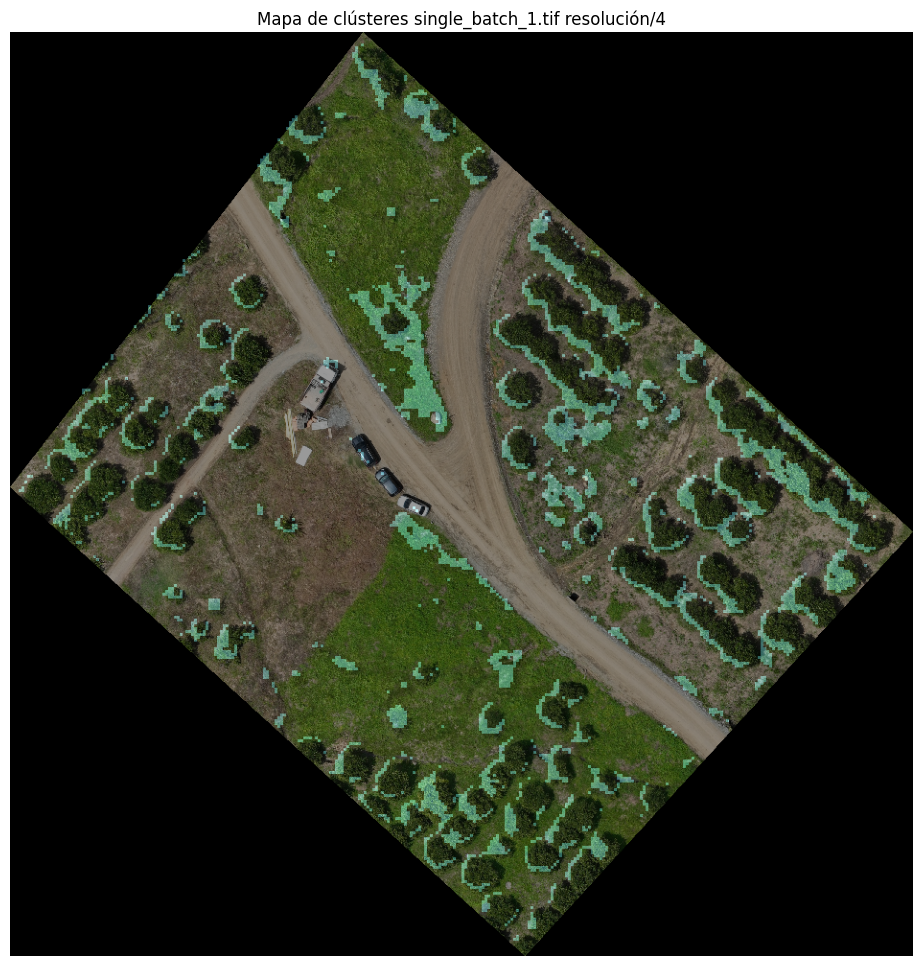

c:\Users\EsSe009\Documents\Vision\EDA_Proyecto\.venv\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


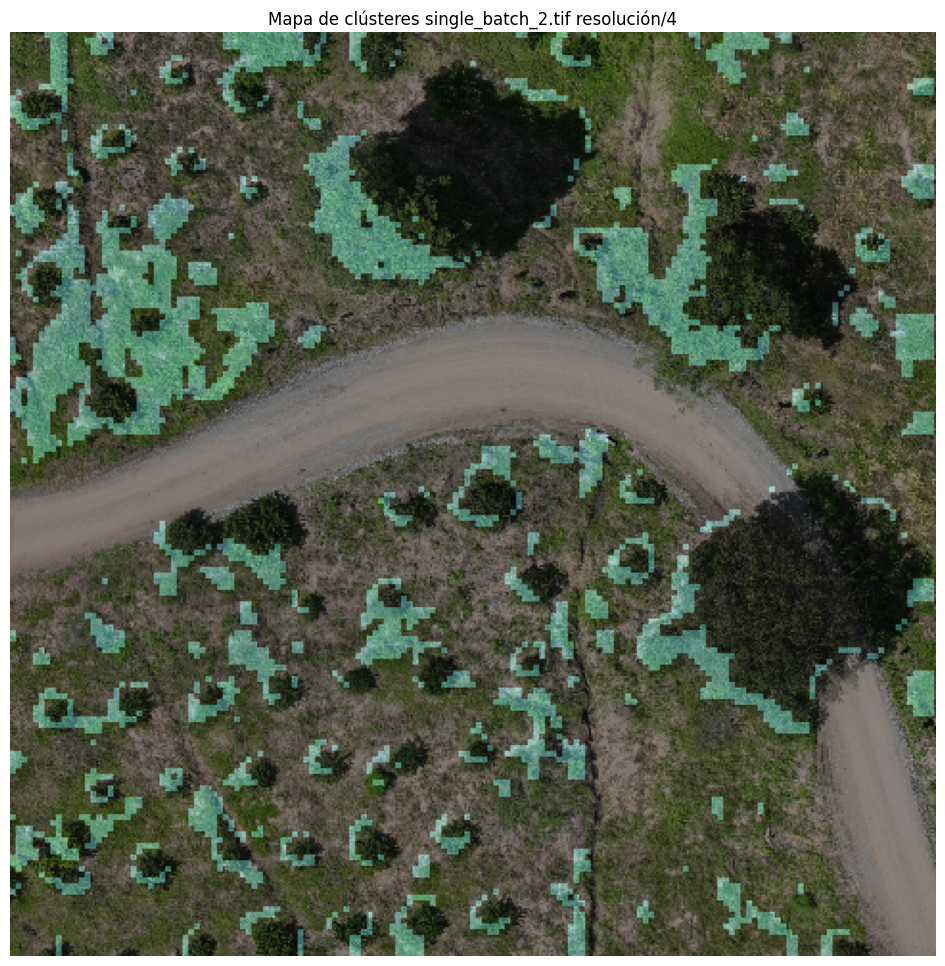

In [ ]:
for imm in range(3):
    imagen_tiff = os.path.join("Samples", f"single_batch_{imm}.tif")
    with rasterio.open(imagen_tiff) as src:
        imagen = src.read()
        imagen = np.transpose(imagen, (1, 2, 0))  # Reordenar a (alto, ancho, bandas)
        imagen=cv2.resize(imagen, (imagen.shape[1]//4, imagen.shape[0]//4), interpolation=cv2.INTER_CUBIC)
    visualizar_mapa_clusters_coloreado(imagen, modelo, tamano=11, 
                                       stride=3,alpha=0.4,
                                       clustersP=[9],Title=f"Mapa de clústeres single_batch_{imm}.tif resolución/4",
                                       bins=128)

c:\Users\EsSe009\Documents\Vision\EDA_Proyecto\.venv\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Se generaron 58420 parches de 10x10 con stride 2
Se construyó una matriz de características HSV con forma: (58420, 86)
Se generaron 223226 parches de 10x10 con stride 2
Se construyó una matriz de características HSV con forma: (223226, 86)
Se generaron 56169 parches de 10x10 con stride 2
Se construyó una matriz de características HSV con forma: (56169, 86)
Aplicando K-Means con 5 clusters...
K-Means finalizado.


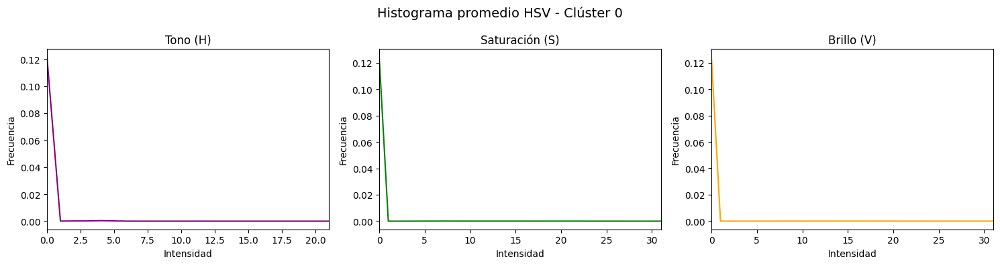

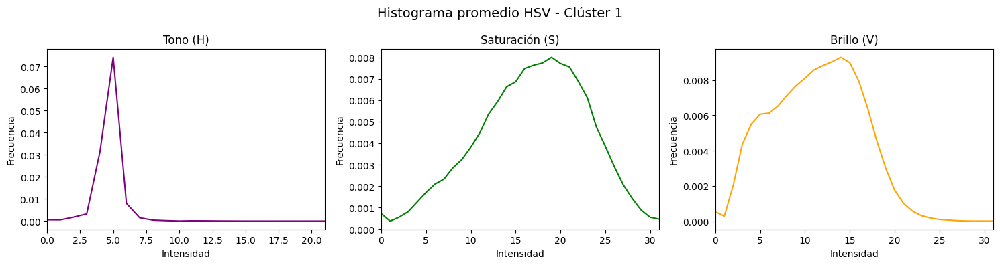

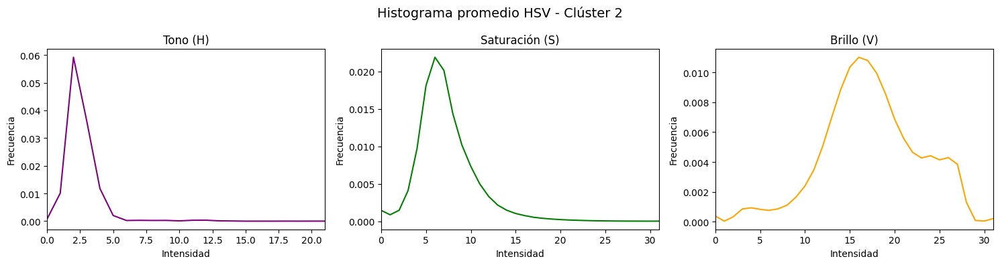

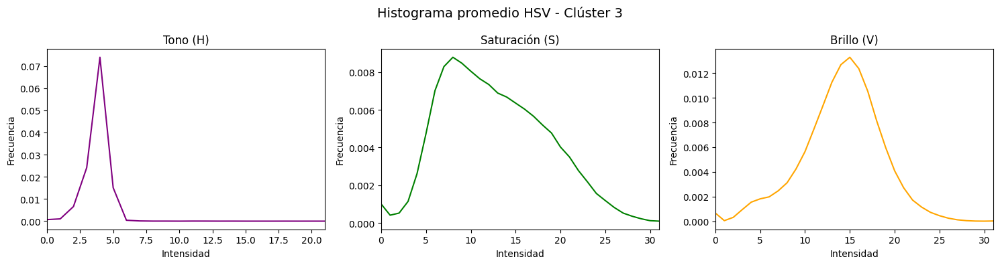

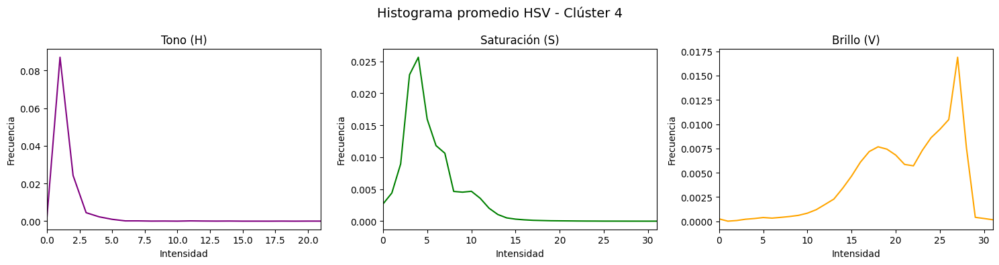

In [ ]:


Xs=[]
for imm in range(3):
    
    imagen_tiff = os.path.join("Samples", f"single_batch_{imm}.tif")
    with rasterio.open(imagen_tiff) as src:
        imagen = src.read()
        imagen = np.transpose(imagen, (1, 2, 0))  # Reordenar a (alto, ancho, bandas)
        imagen=cv2.resize(imagen, (imagen.shape[1]//4, imagen.shape[0]//4), interpolation=cv2.INTER_CUBIC)
    hsv  = cv2.cvtColor(imagen, cv2.COLOR_RGB2HSV)


    parches_hsv=generar_patches_solapados(hsv,10,2)

    Xs.append( construir_vectores_caracteristicas_HSV(parches_hsv,32))
X_HSV=np.concatenate(Xs)
k=5
labels_hsv,modelo_Hsv=aplicar_kmeans(X_HSV,k)
visualizar_histogramas_promedio_HSV(X_HSV,labels_hsv,32)

In [100]:
imagen_tiff = os.path.join("Samples", f"single_batch_{0}.tif")
with rasterio.open(imagen_tiff) as src:
    imagen = src.read()
    imagen = np.transpose(imagen, (1, 2, 0))  # Reordenar a (alto, ancho, bandas)
    imagen=cv2.resize(imagen, (imagen.shape[1]//4, imagen.shape[0]//4), interpolation=cv2.INTER_CUBIC)
hsv  = cv2.cvtColor(imagen, cv2.COLOR_RGB2HSV)
parches_i=generar_patches_solapados(hsv,10,2)
Xi=construir_vectores_caracteristicas_HSV(parches_i,32)
Etiquetas=reconstruir_mapa_clusters(imagen=imagen,X=Xi,model=modelo_Hsv,tamano=10,stride=2,cluster_prioritario=1,umbral=1)


c:\Users\EsSe009\Documents\Vision\EDA_Proyecto\.venv\Lib\site-packages\rasterio\__init__.py:368: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Se generaron 58420 parches de 10x10 con stride 2
Se construyó una matriz de características HSV con forma: (58420, 86)
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
2

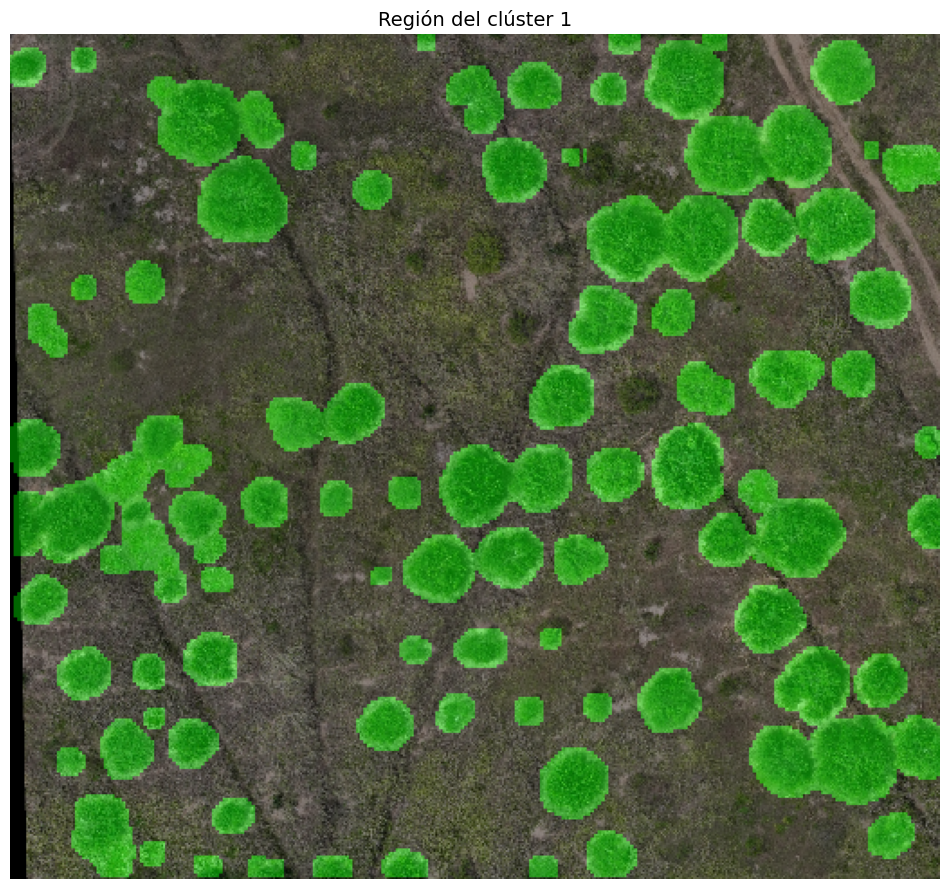

In [101]:
visualizar_mapa_reconstruido(imagen,Etiquetas,1,0.4,[0,255,0])

Se generaron 58420 parches de 10x10 con stride 2
Se construyó una matriz de características con forma: (58420, 96)
Aplicando K-Means con 5 clusters...
K-Means finalizado.


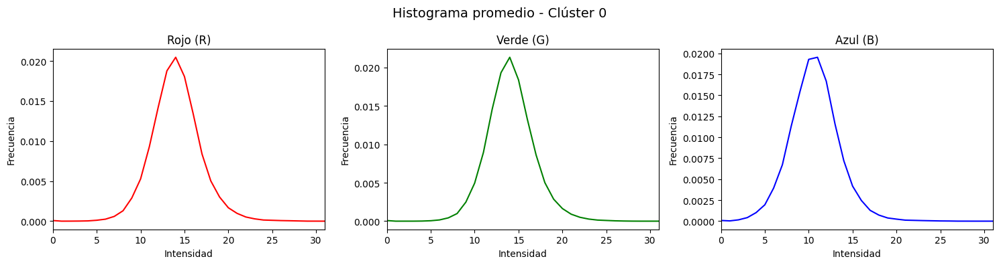

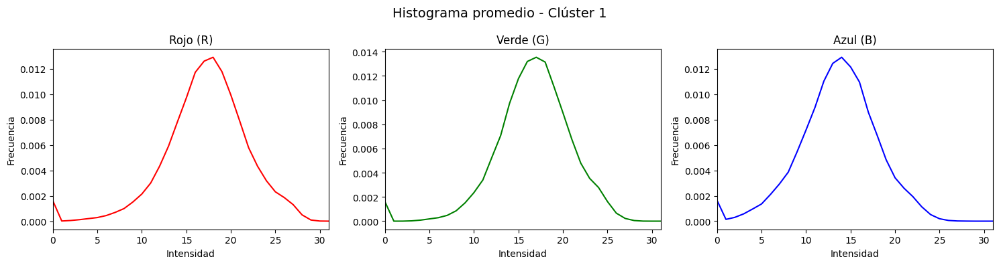

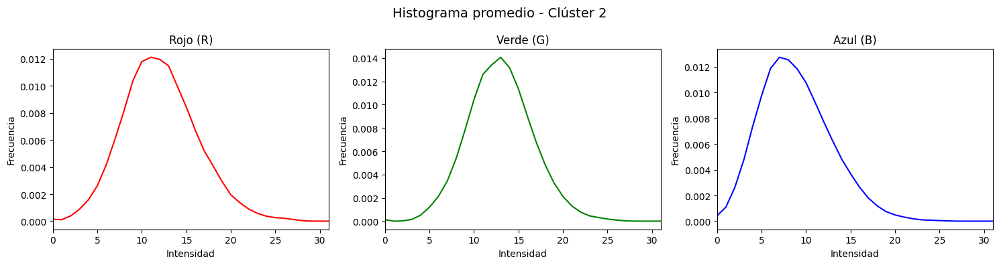

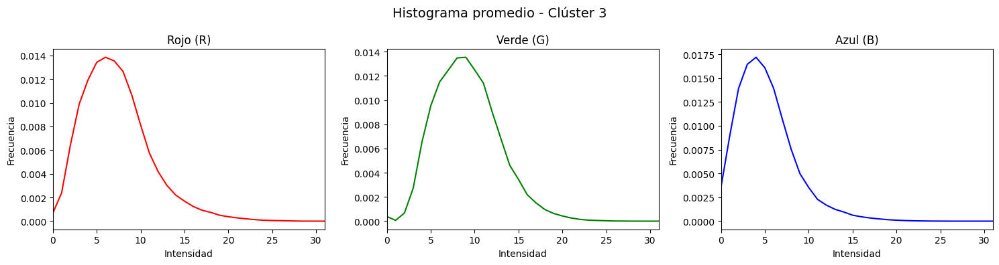

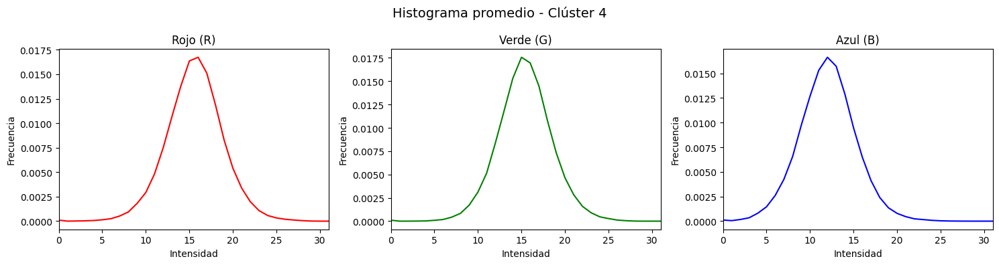

In [103]:
parches_rgb=generar_patches_solapados(imagen,10,2)
X=construir_vectores_caracteristicas(parches_rgb,32)
k=5
labels_knn,modelo_knn=aplicar_kmeans(X,k)
visualizar_histogramas_promedio(X,labels_knn,32)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


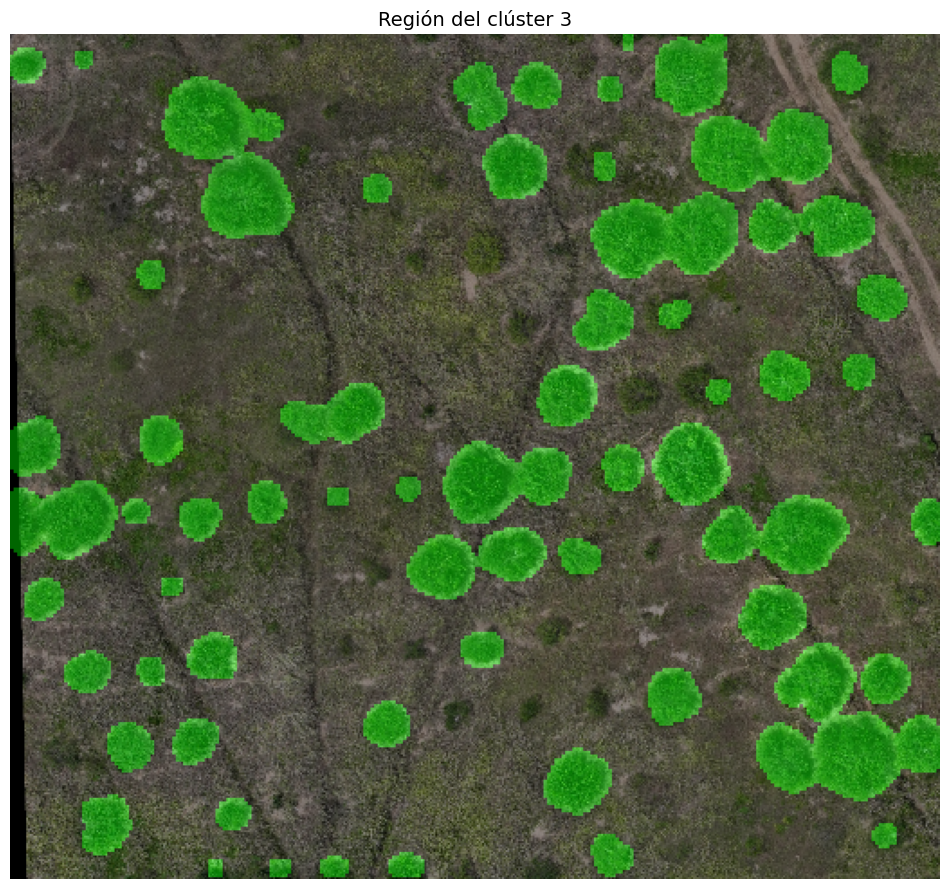

In [105]:
Etiquetas=reconstruir_mapa_clusters(imagen=imagen,X=X,model=modelo_knn,tamano=10,stride=2,cluster_prioritario=3,umbral=2)
visualizar_mapa_reconstruido(imagen,Etiquetas,3,0.4,[0,255,0])

